In [14]:
print("here is where we discover our data, and get sone insights")

here is where we discover our data, and get sone insights


In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [16]:
used = pd.read_csv("/content/hatla2ee_used_cars.csv")
used.head(1)

,page,car_type,car_name,year,mileage,transmission,fuel,price,location,brand,model,car_url,image_url,scraped_at
0,1,used,Mercedes C 180 2025,2025,"5,000 KM",Automatic,Gas,"3,300,000 EGP","Tagamo3 - New Cairo, Cairo",Mercedes,C 180,https://eg.hatla2ee.com/en/car/mercedes/c-180/...,https://legion-images.hatla2ee.com/listing_ima...,2026-04-30 14:20:32




*   drop page num --> done
*   you may drop car name, as we got the same data in other columns

*   transform price & mileage into numeric column --> done
*   get more data from location, like city, town. --> done


*   drop car_URL --> done
*   we may keep scrapped at as an indicator for starting the new job.


*   fix the nulls in model column --> done

*   extracted the governrate and fixed the nulls in it.
*   











In [17]:
used.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10173 entries, 0 to 10172
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   page          10173 non-null  int64 
 1   car_type      10173 non-null  object
 2   car_name      10173 non-null  object
 3   year          10173 non-null  int64 
 4   mileage       10173 non-null  object
 5   transmission  10173 non-null  object
 6   fuel          10173 non-null  object
 7   price         10173 non-null  object
 8   location      10173 non-null  object
 9   brand         10173 non-null  object
 10  model         10171 non-null  object
 11  car_url       10173 non-null  object
 12  image_url     10173 non-null  object
 13  scraped_at    10173 non-null  object
dtypes: int64(2), object(12)
memory usage: 1.1+ MB




*   there are 2 nulls in Model column --> to be fixed



In [18]:
used[used['model'].isna()]

,page,car_type,car_name,year,mileage,transmission,fuel,price,location,brand,model,car_url,image_url,scraped_at
4577,235,used,Nissan Sunny 2015,2015,"185,000 KM",Automatic,Gas,"490,000 EGP",Nissan,Sunny,NaN,https://eg.hatla2ee.com/en/car/nissan/sunny/71...,https://legion-images.hatla2ee.com/listing_ima...,2026-04-30 15:36:38
5886,322,used,BMW X6 2019,2019,"90,000 KM",Automatic,Gas,"2,800,000 EGP",BMW,X6,NaN,https://eg.hatla2ee.com/en/car/bmw/x6/7197351,https://legion-images.hatla2ee.com/listing_ima...,2026-04-30 16:02:21


In [19]:
# fixing the nulls in model column

used.loc[4577 , 'model'] = "Sunny"
used.loc[4577 , 'brand'] = "Nissan"
used.loc[4577 , 'location'] = ""


In [20]:
used[used['model'].isna()]

,page,car_type,car_name,year,mileage,transmission,fuel,price,location,brand,model,car_url,image_url,scraped_at
5886,322,used,BMW X6 2019,2019,"90,000 KM",Automatic,Gas,"2,800,000 EGP",BMW,X6,NaN,https://eg.hatla2ee.com/en/car/bmw/x6/7197351,https://legion-images.hatla2ee.com/listing_ima...,2026-04-30 16:02:21


In [21]:
used.loc[5886 , 'model'] = "X6"
used.loc[4577 , 'brand'] = "BMW"
used.loc[4577 , 'location'] = ""

In [22]:
used.drop(columns = ["page", "car_url", "image_url"] , inplace = True)

In [23]:
used.head(2)

,car_type,car_name,year,mileage,transmission,fuel,price,location,brand,model,scraped_at
0,used,Mercedes C 180 2025,2025,"5,000 KM",Automatic,Gas,"3,300,000 EGP","Tagamo3 - New Cairo, Cairo",Mercedes,C 180,2026-04-30 14:20:32
1,used,BMW X5 M 2015,2015,"180,000 KM",Automatic,Gas,"1,750,000 EGP","Sheikh Zayed City, Giza",BMW,X5 M,2026-04-30 14:20:34


In [24]:
# transform the columns "price" & "mileage"

In [25]:
used["price"] = pd.to_numeric(used["price"].str.replace(r"\D", "", regex=True))
used["mileage"] = pd.to_numeric(used["mileage"].str.replace(r"\D", "", regex=True))

In [26]:
used['price'].max()

111111111111

In [27]:
# dealing with location
used["location"]

,location
0,"Tagamo3 - New Cairo, Cairo"
1,"Sheikh Zayed City, Giza"
2,"Heliopolis, Cairo"
3,"Sheikh Zayed City, Giza"
4,"Sheikh Zayed City, Giza"
...,...
10168,Cairo
10169,Cairo
10170,"Obour City, Cairo"
10171,Cairo


In [28]:
import re
import pandas as pd

gov_aliases = {
    "cairo": ["cairo"],
    "giza": ["giza", "6th of october", "october", "sheikh zayed"],
    "alex": ["alex", "alexandria"],
    "dakahlia": ["dakahlia", "mansoura"],
    "red sea": ["red sea", "hurghada"],
    "beheira": ["beheira", "damanhur"],
    "fayoum": ["fayoum"],
    "gharbia": ["gharbia", "tanta"],
    "ismailia": ["ismailia"],
    "monufia": ["monufia", "shebin el kom"],
    "minya": ["minya"],
    "qalyubia": ["qalyubia", "benha"],
    "new valley": ["new valley"],
    "suez": ["suez"],
    "aswan": ["aswan"],
    "assiut": ["assiut"],
    "beni suef": ["beni suef"],
    "port said": ["port said"],
    "damietta": ["damietta"],
    "sharkia": ["sharkia", "zagazig"],
    "south sinai": ["south sinai", "sharm"],
    "kafr el sheikh": ["kafr el sheikh"],
    "matrouh": ["matrouh"],
    "luxor": ["luxor"],
    "qena": ["qena"],
    "north sinai": ["north sinai"],
    "sohag": ["sohag"]
}


In [29]:
def merge_aliases(base, new):
    for key, values in new.items():
        if key in base:
            base[key] = list(set(base[key] + values))  # merge + deduplicate
        else:
            base[key] = values
    return base

In [30]:
new_aliases = {
    "assiut": ["assyut", "asyut", "assiut"],
    "sharkia": ["sharqia", "sharkia", "faqous", "bilbeis", "abu kabir", "dyarb negm"],
    "fayoum": ["faiyum", "fayoum", "el faiyum"],
    "beni suef": ["beni suef", "ben suef"],
    "new valley": ["el wadi el gedid", "wadi gedid", "kharga", "farafra"],
    "aswan": ["kom ombo"],
    "matrouh": ["mariotya"],
    "sinai": ["sinai"],
    "monufia": ["menofia", "ashmun", "birkat as sab" , "Monufia" ,"Shibin el Kom" , "El Bagour", "Tala" , "Ashmoun" , "Quwaysna"]
}

gov_aliases = merge_aliases(gov_aliases, new_aliases)

In [31]:
used.head(2)

,car_type,car_name,year,mileage,transmission,fuel,price,location,brand,model,scraped_at
0,used,Mercedes C 180 2025,2025,5000,Automatic,Gas,3300000,"Tagamo3 - New Cairo, Cairo",Mercedes,C 180,2026-04-30 14:20:32
1,used,BMW X5 M 2015,2015,180000,Automatic,Gas,1750000,"Sheikh Zayed City, Giza",BMW,X5 M,2026-04-30 14:20:34


In [32]:
#used.info()

In [33]:
#used.loc[used["city"].isna(), "location"].unique()

In [34]:
def normalize(text):
    text = str(text).lower().strip()
    text = re.sub(r"[^\w\s]", " ", text)
    text = re.sub(r"\s+", " ", text)
    return text

In [35]:
def extract_governorate_and_city(location):
    if pd.isna(location) or str(location).strip() == "":
        return None, None

    loc = normalize(location)

    best_match = None
    best_gov = None

    # prioritize longest match
    for gov, aliases in gov_aliases.items():
        for alias in sorted(aliases, key=len, reverse=True):
            if alias in loc:
                best_match = alias
                best_gov = gov
                break
        if best_match:
            break

    if best_match:
        city = loc.replace(best_match, "").strip()
        return best_gov, (city if city else None)

    # fallback → treat whole thing as city
    return None, loc

In [36]:
used[["governorate", "city"]] = used["location"].apply(
    lambda x: pd.Series(extract_governorate_and_city(x))
)

In [37]:
used.head(2)

,car_type,car_name,year,mileage,transmission,fuel,price,location,brand,model,scraped_at,governorate,city
0,used,Mercedes C 180 2025,2025,5000,Automatic,Gas,3300000,"Tagamo3 - New Cairo, Cairo",Mercedes,C 180,2026-04-30 14:20:32,cairo,tagamo3 new
1,used,BMW X5 M 2015,2015,180000,Automatic,Gas,1750000,"Sheikh Zayed City, Giza",BMW,X5 M,2026-04-30 14:20:34,giza,city giza


In [38]:
#used.info()

In [39]:
used.loc[used["governorate"].isna(), "location"].unique()

array(['', 'BMW', '5th Settlement'], dtype=object)

In [40]:
used['model'].unique()

array(['C 180', 'X5 M', 'EcoSport', 'Z4', 'GLA 200', 'Lanos 2', 'M11',
       'Astra', 'Prado', 'Matrix', 'Logan', 'Tiggo 3', 'Sunny',
       'Accent RB', '200', 'Grand Cherokee', '318', '911', 'Viano',
       'Lanos', 'X3', '320i', '218 i', 'Sportage', '320', 'X6', 'Cerato',
       'S 500', 'Other', 'N-Series', 'Corolla', 'Galena', '330S',
       'Terios', 'Accent', 'Megane', 'Focus', '5', 'Qashqai', 'Alto',
       '520', 'Sandero', 'Civic', 'Lancer EX Shark', 'Lancer', 'Arona',
       'Venucia Star', 'F3', 'E 180', 'Kadjar', 'Crossland', 'CLA 200',
       'A4', 'F-Type', 'Range Rover Sport', 'E 350', 'Country man',
       'Velar', 'A 200', 'E 300', 'Elantra', 'A113', 'Golf 4', 'Avante',
       'Range Rover Vogue', 'Ibiza', 'C260L', 'Octavia', 'Passat',
       'Grandland', 'GLE 450', 'Nubira 2', 'Wrangler', 'Optra',
       'E 53 AMG', 'Fiesta', '929', 'Vectra', 'Challenger', 'C 200',
       '5008', '6', 'F-Pace', 'Carens', 'Tiggo 7', 'X4', 'Cayenne S',
       'E 250', 'S60', 'Fluence'

In [41]:
print(used['price'].min() , used['price'].max())

1 111111111111


In [42]:
used['price']

,price
0,3300000
1,1750000
2,850000
3,3700000
4,2000000
...,...
10168,550000
10169,300000
10170,350000
10171,1250000


In [43]:
# Step 1: Define valid prices
valid_prices = used["price"] >= 100000

# Step 2: Compute averages
model_avg = used[valid_prices].groupby("model")["price"].mean()
manufacturer_avg = used[valid_prices].groupby("brand")["price"].mean()
global_avg = used.loc[valid_prices, "price"].mean()

# Step 3: Map averages
used["model_avg"] = used["model"].map(model_avg)
used["manufacturer_avg"] = used["brand"].map(manufacturer_avg)

# Step 4: Replace invalid prices using hierarchy
used["price"] = used["price"].where(
    valid_prices,
    used["model_avg"]
)

# Step 5: Fill remaining NaNs (models with no valid prices)
used["price"].fillna(used["manufacturer_avg"], inplace=True)

# Step 6: Final fallback (manufacturers with no valid prices)
used["price"].fillna(global_avg, inplace=True)

# Step 7: Cleanup
used.drop(columns=["model_avg", "manufacturer_avg"], inplace=True)

/tmp/ipykernel_15902/303237642.py:20: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  used["price"].fillna(used["manufacturer_avg"], inplace=True)
/tmp/ipykernel_15902/303237642.py:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplac

In [44]:
used["price"].isna().sum()

np.int64(0)

In [45]:
print(used['price'].min() , used['price'].max())

100000.0 111111111111.0


In [46]:

top_models = used["model"].value_counts().head(5).index

filtered_data = used[used["model"].isin(top_models)]

avg_prices = (
    filtered_data
    .groupby("model")["price"]
    .mean()
    .sort_values(ascending=False)
)

print(avg_prices)

model
C 180    2.212071e+06
Astra    5.568827e+05
Sunny    5.451453e+05
Optra    5.011214e+05
Logan    3.853202e+05
Name: price, dtype: float64


In [47]:
model_stats = (
    used[used["model"].isin(top_models)]
    .groupby("model")
    .agg(
        avg_price=("price", "mean"),
        count=("price", "count")
    )
    .sort_values(by="count", ascending=False)
)
model_stats

,avg_price,count
model,,
Sunny,5.451453e+05,210
C 180,2.212071e+06,198
Astra,5.568827e+05,179
Logan,3.853202e+05,178
Optra,5.011214e+05,173


/tmp/ipykernel_15902/3347040783.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, model_stats["avg_price"][i], f"n={v}", ha='center', va='bottom')


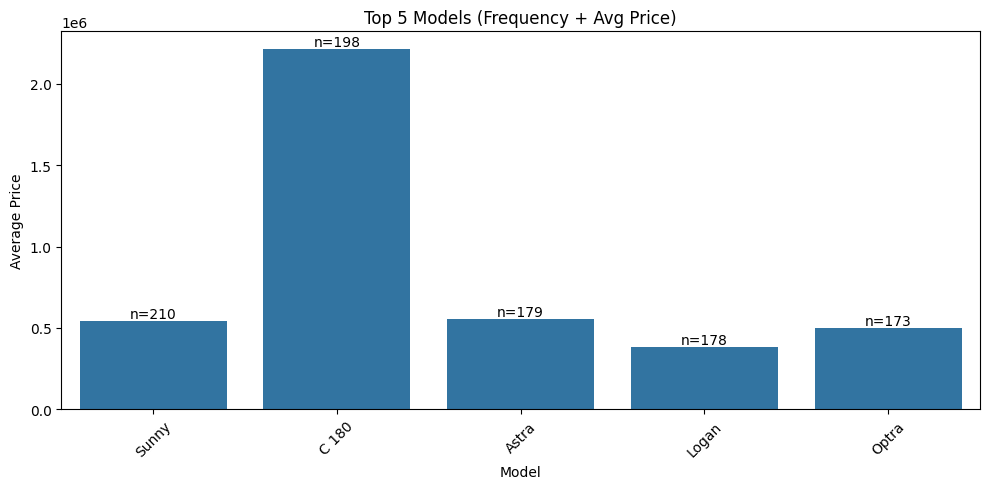

In [48]:
plt.figure(figsize=(10, 5))

sns.barplot(
    x=model_stats.index,
    y=model_stats["avg_price"]
)

# Add frequency as text
for i, v in enumerate(model_stats["count"]):
    plt.text(i, model_stats["avg_price"][i], f"n={v}", ha='center', va='bottom')

plt.title("Top 5 Models (Frequency + Avg Price)")
plt.xlabel("Model")
plt.ylabel("Average Price")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [58]:
# Step 1: Compute average price per (manufacturer, model)
model_brand_price = (
    used
    .groupby(["brand", "model"])["price"]
    .mean()
    .reset_index()
)

# Step 2: Sort and get top 5
top_expensive = model_brand_price.sort_values(
    by="price", ascending=False
).head(5)

print(top_expensive)

       brand             model         price
408     Jeep          Cherokee  2.223444e+09
365  Hyundai               I10  1.208750e+09
424   Jetour           X 70 FL  1.000150e+09
378  Hyundai  Tucson Turbo GDI  1.246762e+08
347  Hyundai             Bayon  1.207042e+08


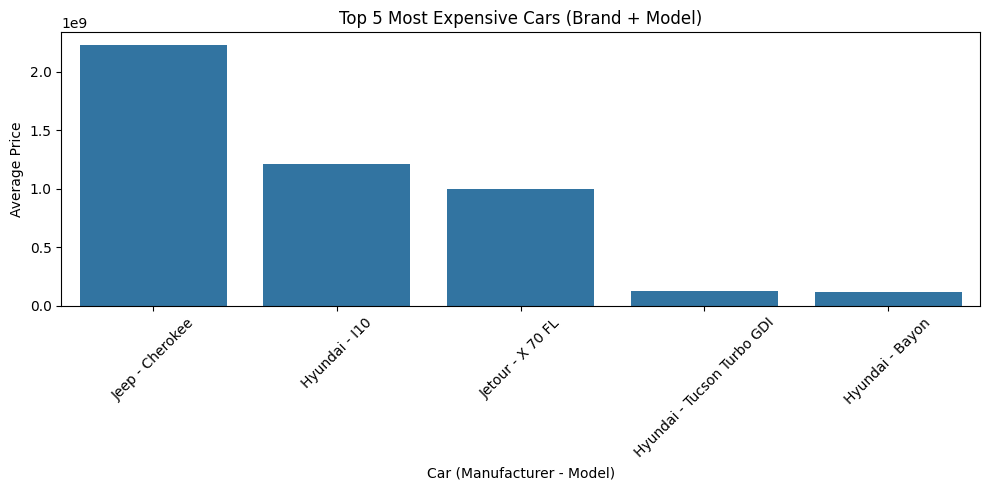

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

top_expensive["label"] = (
    top_expensive["brand"] + " - " + top_expensive["model"]
)

plt.figure(figsize=(10, 5))

sns.barplot(
    x=top_expensive["label"],
    y=top_expensive["price"]
)

plt.title("Top 5 Most Expensive Cars (Brand + Model)")
plt.xlabel("Car (Manufacturer - Model)")
plt.ylabel("Average Price")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [53]:
used['price'].min()

100000.0

In [54]:
used['price'].max()

111111111111.0

In [93]:
df = pd.read_csv("/content/hatla2ee_used_cars.csv")

In [94]:
# fixing the nulls in model column

df.loc[4577 , 'model'] = "Sunny"
df.loc[4577 , 'brand'] = "Nissan"
df.loc[4577 , 'location'] = ""


In [95]:
# fixing the nulls in model column

df.loc[4577 , 'model'] = "BMW"
df.loc[4577 , 'brand'] = "X6"
df.loc[4577 , 'location'] = ""


In [96]:
df["price"] = pd.to_numeric(df["price"].str.replace(r"\D", "", regex=True))
df["mileage"] = pd.to_numeric(df["mileage"].str.replace(r"\D", "", regex=True))

In [68]:
import math
models = df['model'].unique()
n = len(models)

cols = 3
rows = math.ceil(n / cols)

plt.figure(figsize=(5 * cols, 4 * rows))

for i, model in enumerate(models, 1):
    subset = df[df['model'] == model].copy()

    # model-specific IQR
    Q1 = subset['price'].quantile(0.25)
    Q3 = subset['price'].quantile(0.75)

    subset['in_iqr'] = (subset['price'] >= Q1) & (subset['price'] <= Q3)

    ax = plt.subplot(rows, cols, i)

    # all points
    ax.scatter([0]*len(subset), subset['price'])

    # highlighted IQR points
    ax.scatter(
        [0]*subset['in_iqr'].sum(),
        subset[subset['in_iqr']]['price'],
        s=120
    )

    ax.set_title(f"Model {model}")
    ax.set_xticks([])  # hide x-axis since it's single category
    ax.set_ylabel("Price")

plt.tight_layout()
plt.show()

In [125]:
import pandas as pd

def cap_prices_by_model(df, model_col, price_col):
    df = df.copy()

    # Loop through each unique model
    for model in df[model_col].unique():
        # Filter rows for this model
        mask = df[model_col] == model
        prices = df.loc[mask, price_col]

        # Compute quartiles for THIS model only
        q1 = prices.quantile(0.30)
        q3 = prices.quantile(0.70)
        iqr = q3 - q1

        lower_bound = q1# - 1.5 * iqr
        upper_bound = q3# + 1.5 * iqr
        #print(model)
        #print(lower_bound)
        #print(upper_bound)
        #print(q1)
        #print(q3)
        #print(iqr)

        # Replace outliers
        df.loc[mask & (df[price_col] > upper_bound), price_col] = q3
        df.loc[mask & (df[price_col] < lower_bound), price_col] = q1

    return df

In [126]:
df2 = cap_prices_by_model(df, "model", "price")

/tmp/ipykernel_15902/403414250.py:28: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1654999.9999999998' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[mask & (df[price_col] < lower_bound), price_col] = q1


In [122]:
df2['price'].min()

7678.0

In [123]:
df2['price'].max()

1000150000.0